In [1]:
include("speciale_tools.jl")
import JLD
import PyPlot

In [2]:
function find_double_tiles(data,min_mu2; N_limit = (0.5*10^3, 3*10^5), bin_size=50,conditions=(2,0.2),max_iter=10000)
    #println("Function call")
    # initialize mask
    dims = size(data)
    N =  dims[1]*dims[2]
    BM_mask = zeros(Bool,dims...)
    
    # If area is to small return false and exit function
    # serves as a lower limit for the recursive function
    if N < N_limit[1]
        return BM_mask
    end
    
    # If N is under max limit check for bimodal 
    bm_tile = false
    if N < N_limit[2]
        n_bins = round(Int64,N/bin_size)
        bm_tile, cons, p_fit = double_tile(reshape(data,:),n_bins,min_mu2,conditions=conditions,max_iter=max_iter)
        if bm_tile
            println("")
            println("Sucess")
            println("p_fit: $p_fit")
            println("cons: $cons")
        end
    end
    
    
    if bm_tile
        BM_mask .= true
    else
        # If tile not bimodal, Split it in 4 and try again
        row_split = floor(Int64,dims[1]/2)
        col_split = floor(Int64,dims[2]/2)
        
        tiles = [(1:row_split,1:col_split),((row_split+1):dims[1],1:col_split),
            (1:row_split,(col_split+1):dims[2]),((row_split+1):dims[1],(col_split+1):dims[2])]
        
        for elem in tiles
            BM_mask[elem...] .= find_double_tiles(data[elem...], min_mu2,
                N_limit =N_limit, bin_size=bin_size,conditions=conditions,max_iter=max_iter)
        end
        
    end
    
    return BM_mask
end

find_double_tiles (generic function with 1 method)

In [3]:
function double_tile(data,n_bins,min_mu2;max_iter=10000,conditions=(2,0.2))
    p_fit,y,w,edges,w_sum = fit_bimodal_gauss(data,n_bins,max_iter)
    
    ad = sqrt(2)*abs(p_fit[3]-p_fit[4])/sqrt(p_fit[5]^2+p_fit[6]^2)
    sr = minimum([p_fit[1]*p_fit[5],p_fit[2]*p_fit[6]])/maximum([p_fit[1]*p_fit[5],p_fit[2]*p_fit[6]])
    
    mu_high = maximum([p_fit[3],p_fit[4]])    
    
    #acceptable_sigma = maximum([p_fit[5],p_fit[6]]) <10
    
    BM_tile = (ad>conditions[1])&(sr>conditions[2])&( mu_high >min_mu2)
    
    return BM_tile, [ad,sr,mu_high], p_fit
end


double_tile (generic function with 1 method)

In [4]:
function find_y_seed(p_fit,y,min_ratio = 0.99)
    p_water = p_fit[[1,3,5]]
    p_nonwater = p_fit[[2,4,6]]
    ratio = gauss_model(y,p_water)./bimodal_gauss_model(y, p_fit)
    # Select y_seed where the single gauuss divege from the bimodal_gauss_model
    y_seed = y[y.>p_water[2]][ findlast(ratio[y.<p_water[3]].>min_ratio)-1]
    return y_seed
end
## meybe

function find_y_seed2(p_fit,y,min_ratio = 0.99)
    p_water = p_fit[[1,3,5]]
    p_nonwater = p_fit[[2,4,6]]
     ratio = gauss_model(y,p_nonwater)./bimodal_gauss_model(y, p_fit);
    y_seed = y[y.>p_water[2]][findfirst(ratio[y.>p_water[2]] .>min_ratio)]
    return y_seed
end

find_y_seed2 (generic function with 2 methods)

In [5]:
function sse_water_fit_double(band,bm_mask, p_target,w_sum,edges,y, rg_thresholds)
    #use region growinf

    rg_mask, steps = region_growing(band .> rg_thresholds[1],band .> rg_thresholds[2]);
    
    # select the water pixelss in the selected tiles
    data = reshape(band,:)[reshape(rg_mask.&bm_mask,:)];
    
    # Compare histogram with the emepircal in p_water
    h = StatsBase.fit(StatsBase.Histogram, data,edges)
    w_sel = h.weights./w_sum;
    w_water_est = gauss_model(y,p_target)
    
    # return sum of squred errors
    SSE = (w_sel .- w_water_est)'*(w_sel .- w_water_est)
    return SSE
end


sse_water_fit_double (generic function with 1 method)

# Houston

In [205]:
data_folder = "/home/data/simon/processed/test_areas/houston_new/flood"
#figure_folder = "/home/data/simon/result/HSBA_loss2/HSBA_houston"

VV = [JLD.load(joinpath(data_folder,"VV_co.jld"),"data"),
    JLD.load(joinpath(data_folder,"VV_pre_median.jld"),"data")]


VH = [JLD.load(joinpath(data_folder,"VH_co.jld"),"data"), 
    JLD.load(joinpath(data_folder,"VH_pre_median.jld"),"data")];


In [206]:
data_folder = "/home/data/simon/processed/test_areas/houston_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
VV = (sum(_load_jld(VV_files,data_folder))./length(VV_files))[:,end:-1:1];
VH =(sum(_load_jld(VH_files,data_folder))./length(VH_files))[:,end:-1:1];

In [216]:
gamma = [abs.(band) for band in _load_jld(coherence_VV_files,data_folder)[2:end]]
gamma = (sum(gamma)./length(gamma))[:,end:-1:1];

In [208]:
pre_VV = 10 .*log10.(VV);
pre_VH = 10 .*log10.(VH);

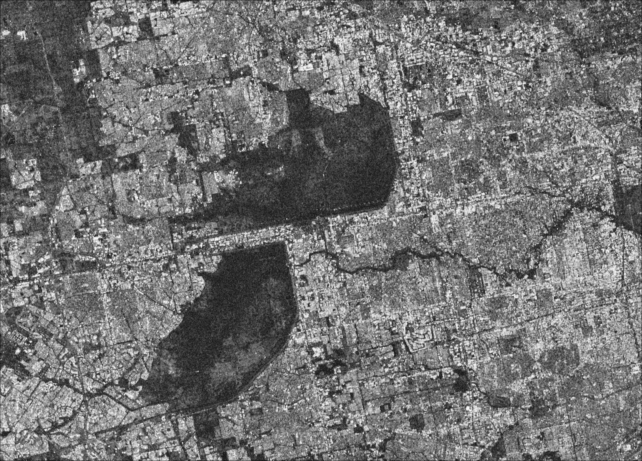

In [217]:
img_gamma = Colors.RGB.(gamma,gamma,gamma)

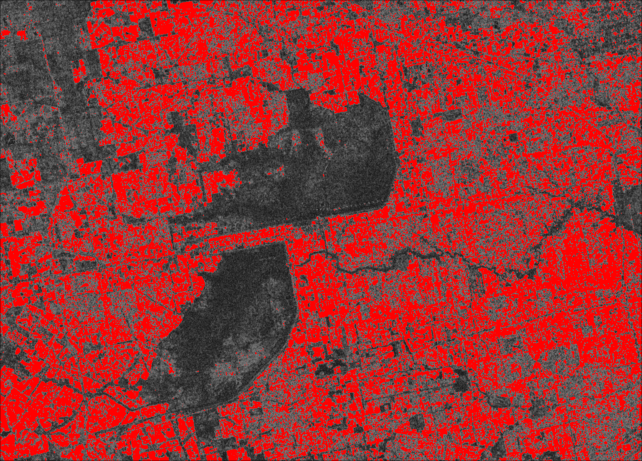

In [246]:
min_gamma = 0.5
add_mask(img_gamma,gamma.>min_gamma,(1,0,0))

### VV

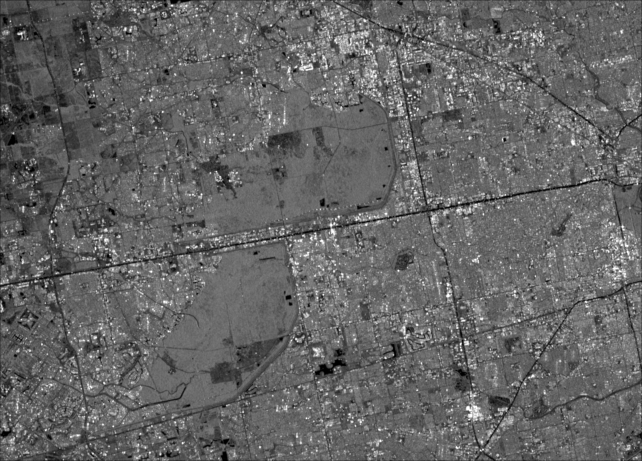

In [223]:
imgVV = pretty_img([VV,VV],min_vv,max_vv,1)

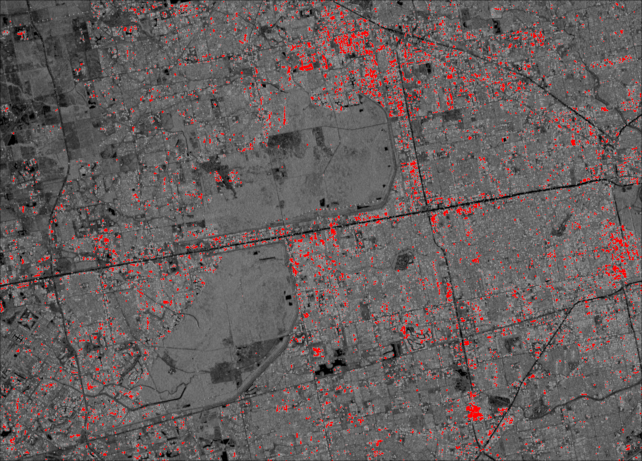

In [233]:
min_mu2 = -4
add_mask(imgVV,pre_VV .>min_mu2,(1,0,0))

In [234]:
# Find the tiles to fit bimodal
bm_mask_VV = find_double_tiles(pre_VV,min_mu2);


Sucess
p_fit: [0.16640222008901787, 0.06362525810705809, -9.862344936307782, -0.14124868510749217, 3.399680443628998, 3.8847245869979017]
cons: [2.6631185382385683, 0.4369105968288631, -0.14124868510749217]

Sucess
p_fit: [0.2933081439131839, 0.9252745967957517, -9.72483275584453, -3.9988295530081444, 2.3378879000620345, 0.4027537298467926]
cons: [3.413439623214621, 0.5434535187166004, -3.9988295530081444]

Sucess
p_fit: [0.06660895301046901, 0.06677023026334343, -9.391725671494715, -3.2934436466688313, 3.0921913624410915, 2.92380762263595]
cons: [2.026561087761266, 0.9478349049561667, -3.2934436466688313]

Sucess
p_fit: [0.15313291124325276, 0.03507757305873982, -10.13688630044672, -3.9405397759111467, 2.0193620245933914, 1.9012866134503548]
cons: [3.159445790943521, 0.215672317173207, -3.9405397759111467]

Sucess
p_fit: [0.13204826532758376, 0.029812262220972566, -9.100578455705879, -2.916338780654661, 2.1669058140426336, 3.711676715637552]
cons: [2.034904622974192, 0.38671617699641

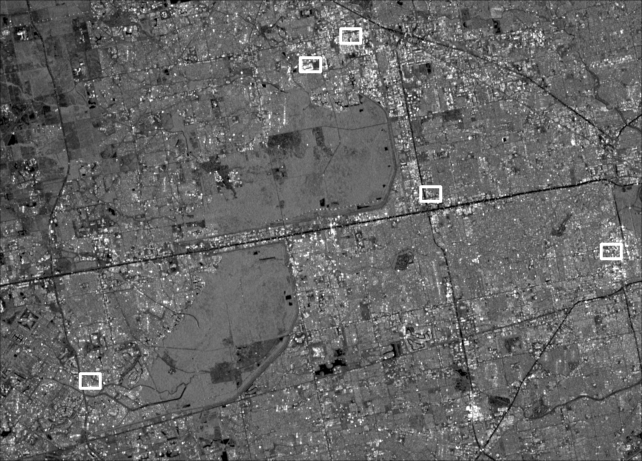

In [235]:
subset_edges = get_edges(bm_mask_VV );
img_save = add_mask(imgVV,subset_edges,(1,1,1))

In [236]:
# fit bimodel
data = reshape(pre_VV,:)[reshape(bm_mask_VV,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

y_seed = find_y_seed2(p_fit,y)

-1.75

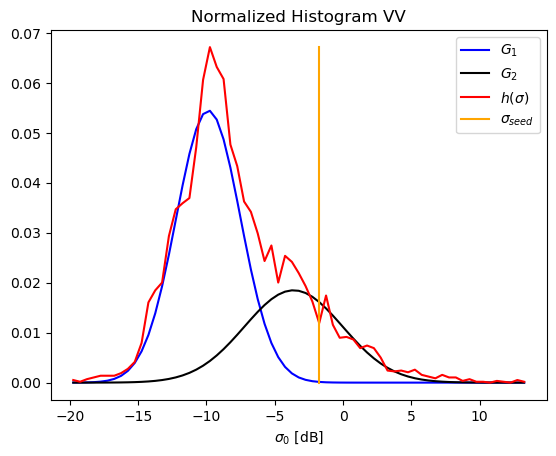

PyObject <matplotlib.legend.Legend object at 0x7f8424867c70>

In [237]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

### opt one

res = Optim.optimize(
    t -> sse_water_fit_double(pre_VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

## opt 2d

In [238]:
t_0 = [y_seed, y_seed-2]
res = Optim.optimize(
    t -> sse_water_fit_double(pre_VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, t),t_0)
thresholds1 = res.minimizer

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


2-element Array{Float64,1}:
  0.21728515624999895
 -6.763476562499996  

In [239]:
thresholds = thresholds1   # [-7,-9] similar to article

2-element Array{Float64,1}:
  0.21728515624999895
 -6.763476562499996  

In [240]:

VV_double_mask, steps = region_growing(pre_VV .> thresholds[1],
                                pre_VV .> thresholds[2]);


In [242]:
# select the water pixelss in the selected tiles
data = reshape(pre_VV,:)[reshape(VV_double_mask.&bm_mask_VV,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

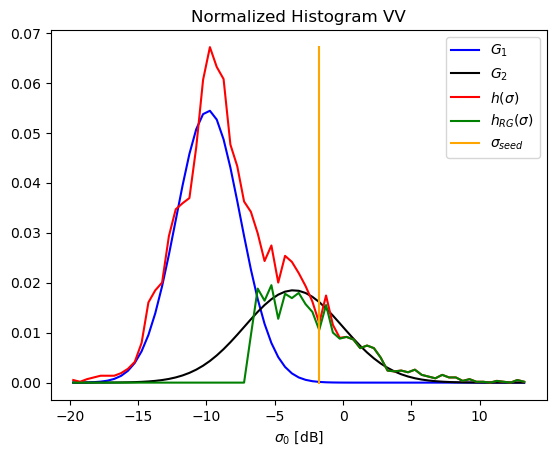

PyObject <matplotlib.legend.Legend object at 0x7f8424867a30>

In [243]:

PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])


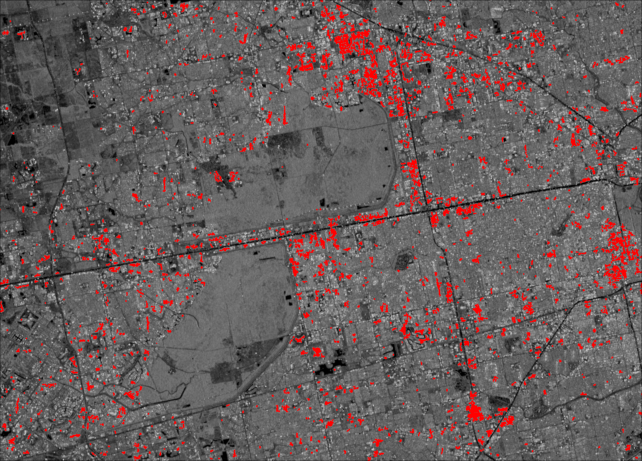

In [251]:
add_mask(imgVV,VV_double_mask
,(1,0,0))

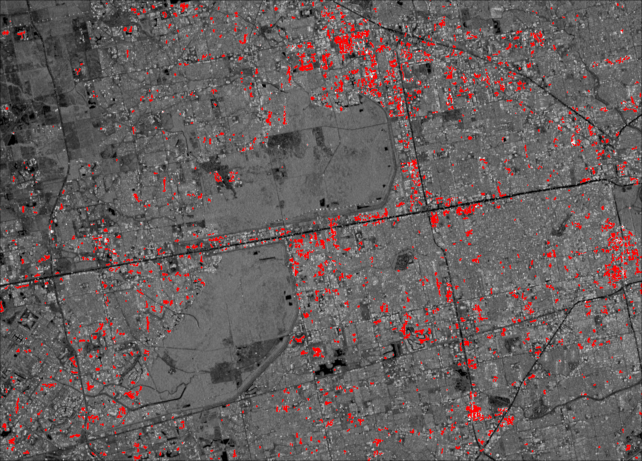

In [250]:
add_mask(imgVV,VV_double_mask .& (gamma.>0.6) ,(1,0,0))

### VH

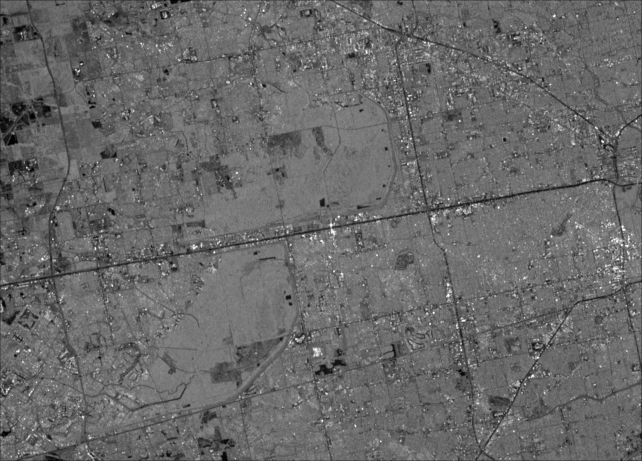

In [254]:
imgVH =  pretty_img([VH,VH],min_vh,max_vh,1)

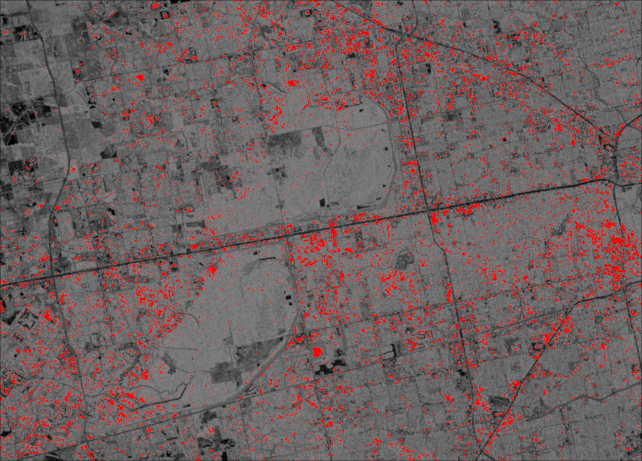

In [255]:
min_mu2 = -14
add_mask(imgVH,pre_VH .>min_mu2,(1,0,0))

In [256]:
# Find the tiles to fit bimodal
bm_mask_VH = find_double_tiles(pre_VH,min_mu2);


Sucess
p_fit: [0.16349105124317678, 0.029463358991884674, -18.915745516087522, -12.330331213349817, 1.9881761042616706, 2.461203930246928]
cons: [2.943561113170235, 0.22309047143552946, -12.330331213349817]

Sucess
p_fit: [0.179869473407328, 0.060137423709575984, -17.437700884460806, -13.885582320737958, 1.5065994915813838, 1.8318407271306616]
cons: [2.117983454239181, 0.4065156312408359, -13.885582320737958]

Sucess
p_fit: [0.18891538650880543, 0.06508003319895546, -17.348309464990734, -13.681054961294937, 1.590013825713189, 1.3737834441038255]
cons: [2.4681400333455423, 0.2976444659689505, -13.681054961294937]

Sucess
p_fit: [0.22015662601076294, 0.0672960815109627, -16.729869920334565, -13.320389674003483, 1.2099706570929403, 1.6178974439885336]
cons: [2.386639541269899, 0.4087277896513073, -13.320389674003483]


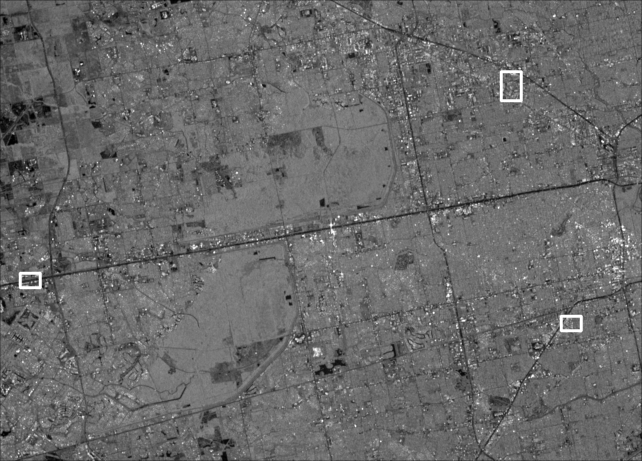

In [257]:
subset_edges = get_edges(bm_mask_VH );
img_save = add_mask(imgVH,subset_edges,(1,1,1))

In [258]:
# fit bimodel
data = reshape(pre_VH,:)[reshape(bm_mask_VH,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

y_seed = find_y_seed2(p_fit,y)

-9.7

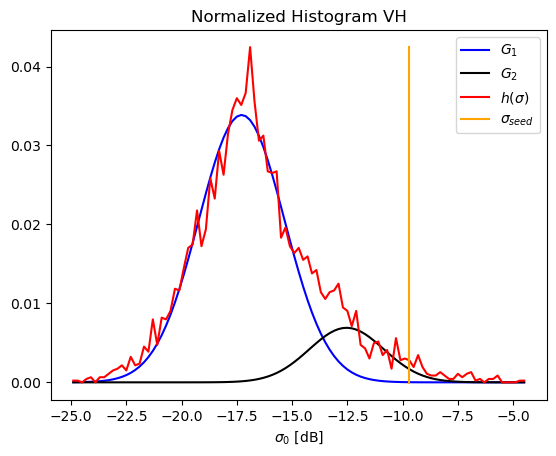

PyObject <matplotlib.legend.Legend object at 0x7f8424ade850>

In [259]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

### opt one

res = Optim.optimize(
    t -> sse_water_fit_double(pre_VH,bm_mask_VH,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

## opt 2d

In [260]:
t_0 = [y_seed, y_seed-2]
res = Optim.optimize(
    t -> sse_water_fit_double(pre_VH,bm_mask_VH,
                    p_fit[[2,4,6]],w_sum,edges,y, t),t_0)
thresholds1 = res.minimizer

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


2-element Array{Float64,1}:
 -13.519300842285155
 -11.009027862548827

In [261]:
thresholds = thresholds1  

2-element Array{Float64,1}:
 -13.519300842285155
 -11.009027862548827

In [262]:

VH_double_mask, steps = region_growing(pre_VH .> thresholds[1],
                                pre_VH .> thresholds[2]);


In [263]:
# select the water pixelss in the selected tiles
data = reshape(pre_VH,:)[reshape(VH_double_mask.&bm_mask_VH,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

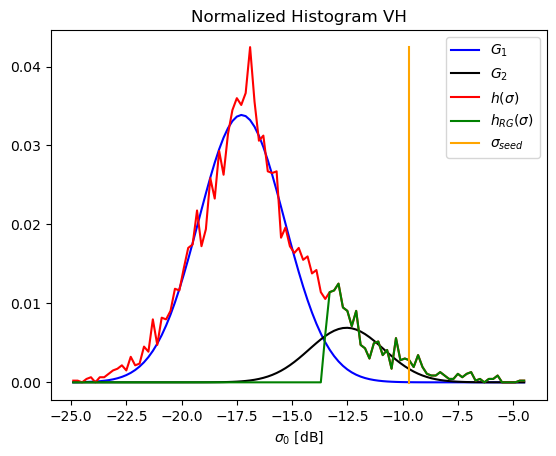

PyObject <matplotlib.legend.Legend object at 0x7f8424672310>

In [264]:

PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])


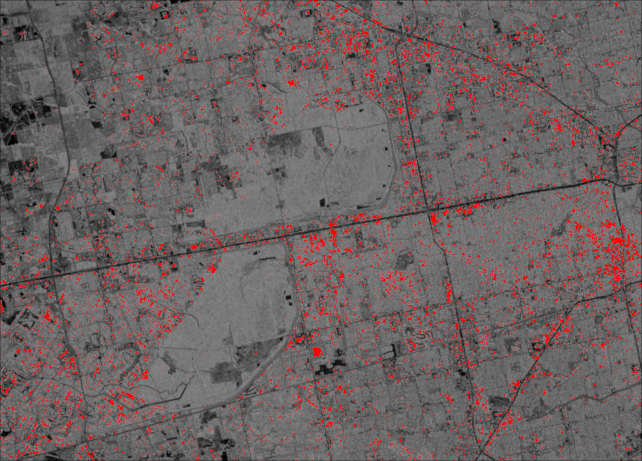

In [266]:
add_mask(imgVH,VH_double_mask,(1,0,0))

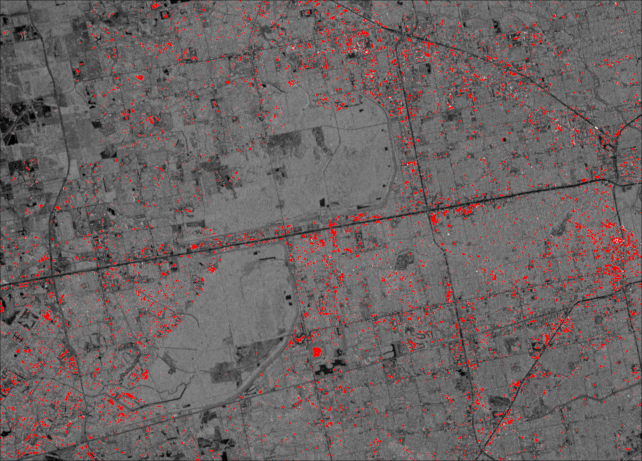

In [269]:
add_mask(imgVH,VH_double_mask .& (gamma .> min_gamma),(1,0,0))

# Vejle

In [271]:
data_folder = "/home/data/simon/processed/test_areas/vejle_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
VV = (sum(_load_jld(VV_files,data_folder))./length(VV_files))[:,end:-1:1];
VH =(sum(_load_jld(VH_files,data_folder))./length(VH_files))[:,end:-1:1];

In [272]:
gamma = [abs.(band) for band in _load_jld(coherence_VV_files,data_folder)[2:end]]
gamma = (sum(gamma)./length(gamma))[:,end:-1:1];

In [273]:
pre_VV = 10 .*log10.(VV);
pre_VH = 10 .*log10.(VH);

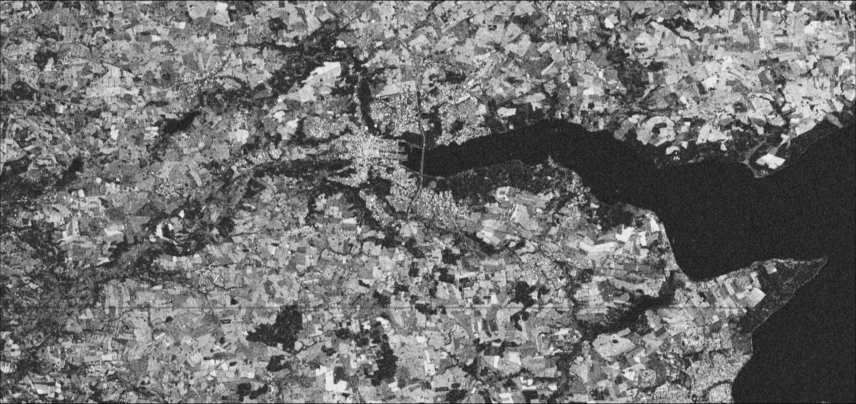

In [274]:
img_gamma = Colors.RGB.(gamma,gamma,gamma)

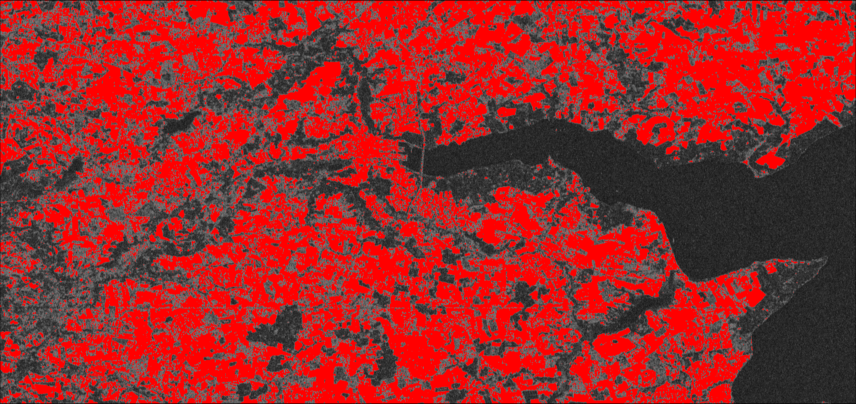

In [279]:
min_gamma = 0.5
add_mask(img_gamma,gamma .>min_gamma,(1,0,0))

### VV

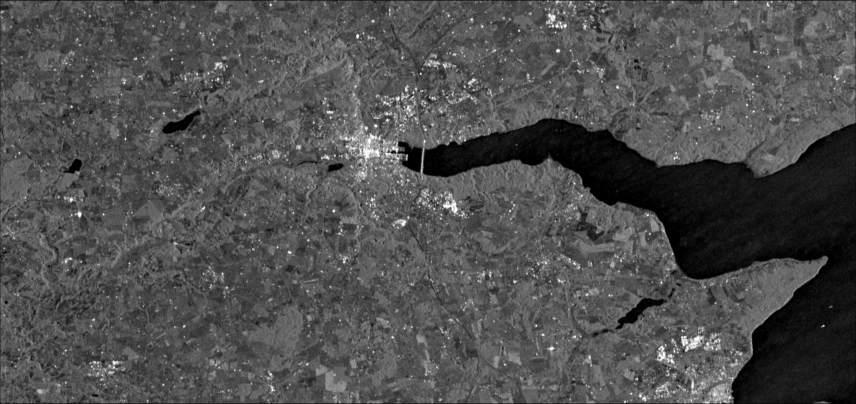

In [280]:
imgVV = pretty_img([VV,VV],min_vv,max_vv,1)

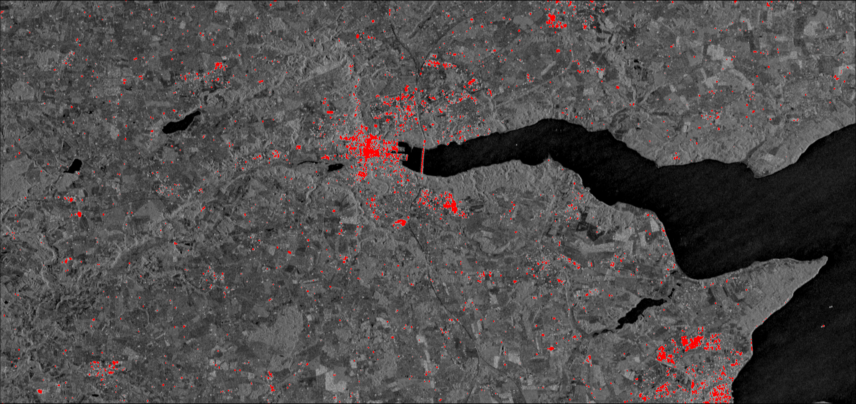

In [281]:
min_mu2 = -4
add_mask(imgVV,pre_VV .>min_mu2,(1,0,0))

In [282]:
# Find the tiles to fit bimodal
bm_mask_VV = find_double_tiles(pre_VV,min_mu2);


Sucess
p_fit: [0.18651999740805358, 0.03389444539918961, -4.982162699225495, 3.2663555171497283, 3.531007784203938, 4.316009186739847]
cons: [2.0918908106761065, 0.2221195662985057, 3.2663555171497283]

Sucess
p_fit: [0.16161678804975646, 0.023919954663091148, -11.903156709500093, -3.0739341346222835, 1.6867344335038617, 5.534986462054365]
cons: [2.1579296950931517, 0.48567274556564793, -3.0739341346222835]

Sucess
p_fit: [0.08627400161065892, 0.006926240687642037, -11.242663270339106, -1.8195635784865416, 1.901672725915552, 5.372102468013508]
cons: [2.338452538030964, 0.22679117291158588, -1.8195635784865416]


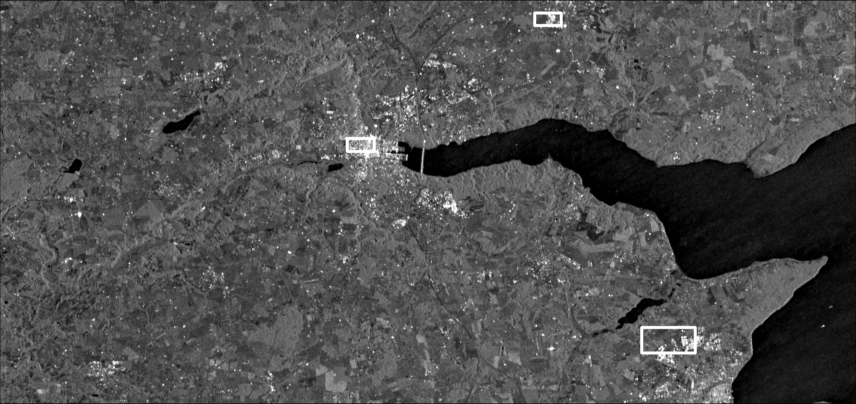

In [283]:
subset_edges = get_edges(bm_mask_VV );
img_save = add_mask(imgVV,subset_edges,(1,1,1))

In [284]:
# fit bimodel
data = reshape(pre_VV,:)[reshape(bm_mask_VV,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

y_seed = find_y_seed2(p_fit,y)

-4.75

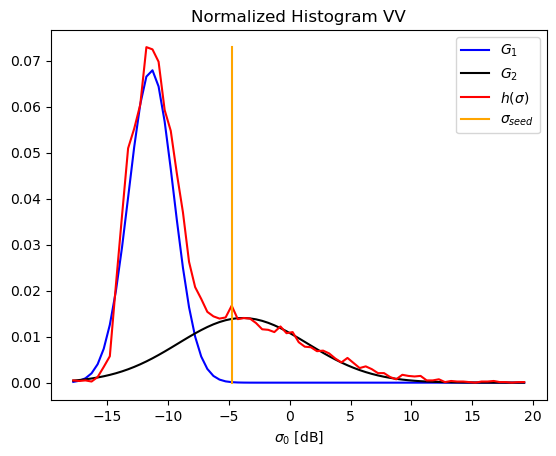

PyObject <matplotlib.legend.Legend object at 0x7f84246444c0>

In [285]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

### opt one

res = Optim.optimize(
    t -> sse_water_fit_double(pre_VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

## opt 2d

In [286]:
t_0 = [y_seed, y_seed-2]
res = Optim.optimize(
    t -> sse_water_fit_double(pre_VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, t),t_0)
thresholds1 = res.minimizer

Max Iter reached:  region_growing()


2-element Array{Float64,1}:
 -8.196972656249999
 -5.339990234375   

In [287]:
thresholds = thresholds1   # [-7,-9] similar to article

2-element Array{Float64,1}:
 -8.196972656249999
 -5.339990234375   

In [288]:

VV_double_mask, steps = region_growing(pre_VV .> thresholds[1],
                                pre_VV .> thresholds[2]);


In [289]:
# select the water pixelss in the selected tiles
data = reshape(pre_VV,:)[reshape(VV_double_mask.&bm_mask_VV,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

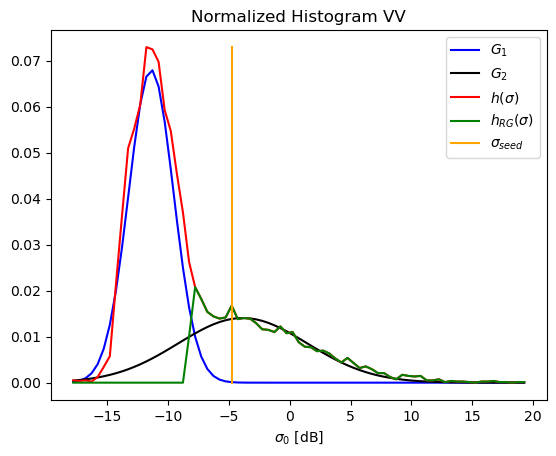

PyObject <matplotlib.legend.Legend object at 0x7f8416522280>

In [290]:

PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])


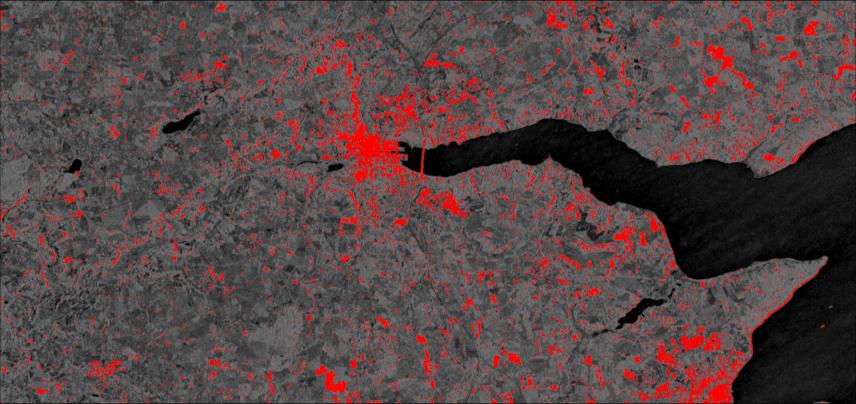

In [292]:
add_mask(imgVV,VV_double_mask,(1,0,0))

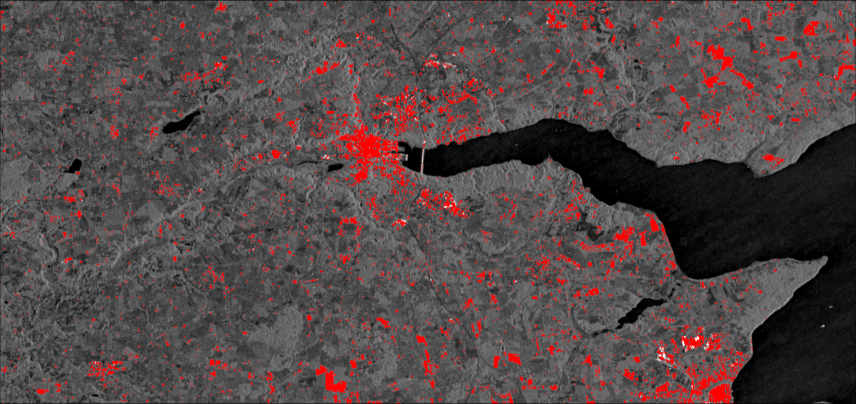

In [297]:
add_mask(imgVV,VV_double_mask .& (gamma.>min_gamma),(1,0,0))

### VH

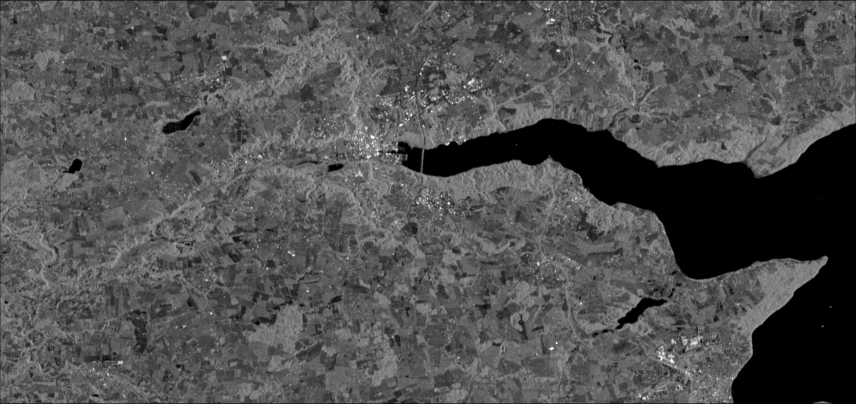

In [95]:
imgVH = Colors.Gray.(db_scale_img(VH,min_vh,max_vh))

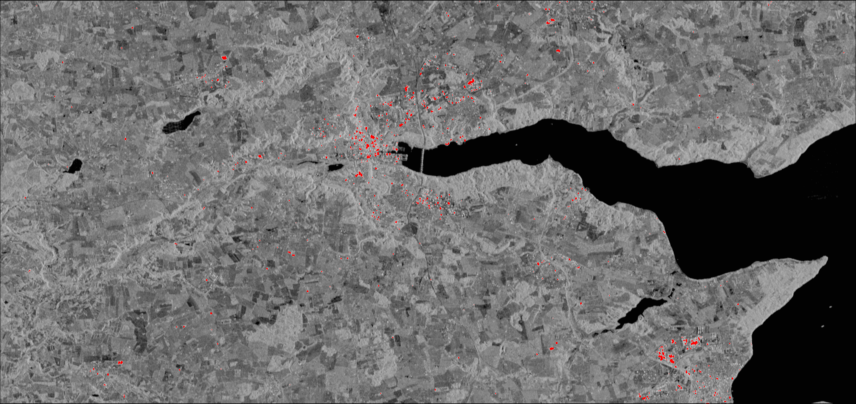

In [113]:
min_mu2 = -10

test = pretty_img([VH,VH],min_vh,max_vh)
add_mask(test,pre_VH .>min_mu2,(1,0,0))

In [114]:
# Find the tiles to fit bimodal
bm_mask_VH = find_double_tiles(pre_VH,min_mu2);


Sucess
p_fit: [0.5706674507209687, 0.019888789898962773, -28.298222556847108, 13.55726548811975, 0.5989323226225312, 26.583251230238403]
cons: [2.226122770459074, 0.6464640786940882, 13.55726548811975]


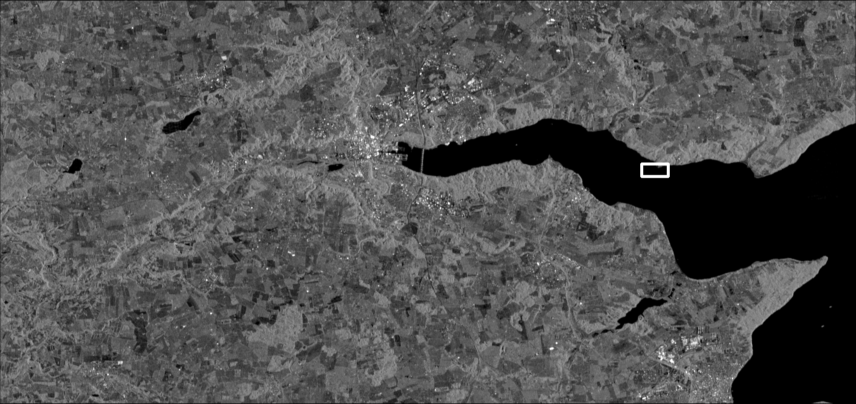

In [115]:
subset_edges = get_edges(bm_mask_VH );
img_save = add_mask(imgVH,subset_edges,(1,1,1))

In [116]:
# fit bimodel
data = reshape(pre_VH,:)[reshape(bm_mask_VH,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

y_seed = find_y_seed2(p_fit,y)

-25.5

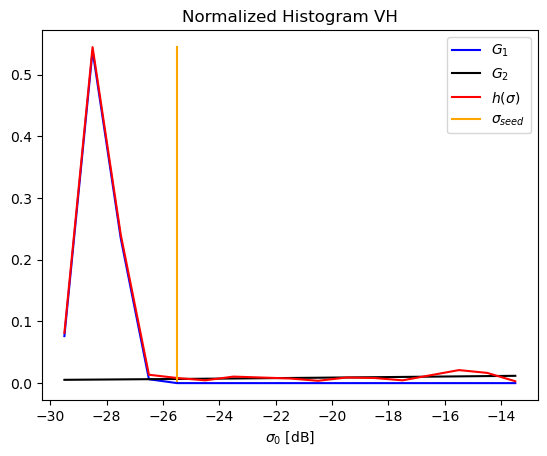

PyObject <matplotlib.legend.Legend object at 0x7f8424d06af0>

In [117]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

### opt one

res = Optim.optimize(
    t -> sse_water_fit_double(pre_VH,bm_mask_VH,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

## opt 2d

In [119]:
t_0 = [y_seed, y_seed-2]
res = Optim.optimize(
    t -> sse_water_fit_double(pre_VH,bm_mask_VH,
                    p_fit[[2,4,6]],w_sum,edges,y, t),t_0)
thresholds1 = res.minimizer

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


2-element Array{Float64,1}:
 -22.68728103637695 
 -26.626271057128896

In [120]:
thresholds = thresholds1  

2-element Array{Float64,1}:
 -22.68728103637695 
 -26.626271057128896

In [121]:

VH_double_mask, steps = region_growing(pre_VH .> thresholds[1],
                                pre_VH .> thresholds[2]);


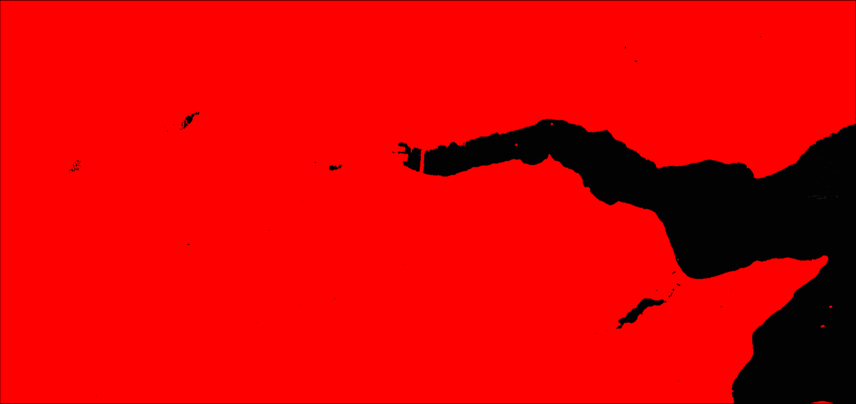

In [122]:
add_mask(test,VH_double_mask,(1,0,0))

In [123]:
# select the water pixelss in the selected tiles
data = reshape(pre_VH,:)[reshape(VH_double_mask.&bm_mask_VH,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

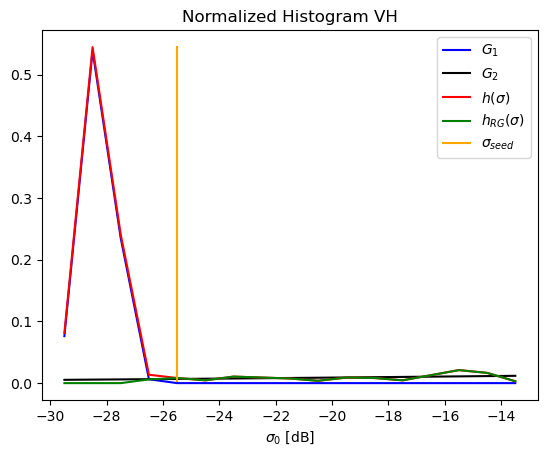

PyObject <matplotlib.legend.Legend object at 0x7f8424c716d0>

In [124]:

PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])


# RIBE

In [6]:
data_folder = "/home/data/simon/processed/test_areas/ribe_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
VV = (sum(_load_jld(VV_files,data_folder))./length(VV_files))[end:-1:1,:];


In [8]:
VH = (sum(_load_jld(VH_files,data_folder)[1:length(VH_files) .!= 3])./(length(VH_files)-1))[end:-1:1,:];

In [12]:
gamma = [abs.(band) for band in _load_jld(coherence_VV_files,data_folder)[2:end]]
gamma = (sum(gamma)./length(gamma))[end:-1:1,:];

In [13]:
pre_VV = 10 .*log10.(VV);
pre_VH = 10 .*log10.(VH);

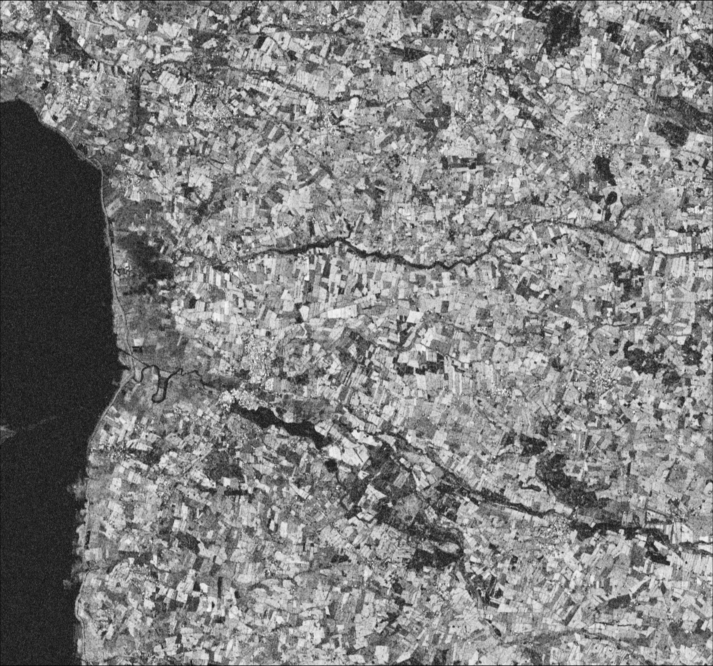

In [14]:
img_gamma = Colors.RGB.(gamma,gamma,gamma)

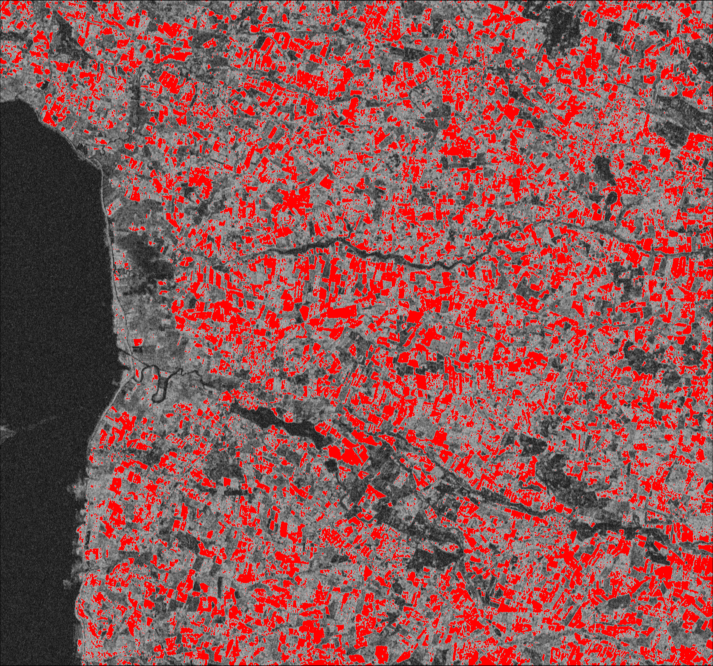

In [16]:
min_gamma = 0.7
add_mask(img_gamma,gamma .>min_gamma,(1,0,0))

### VV

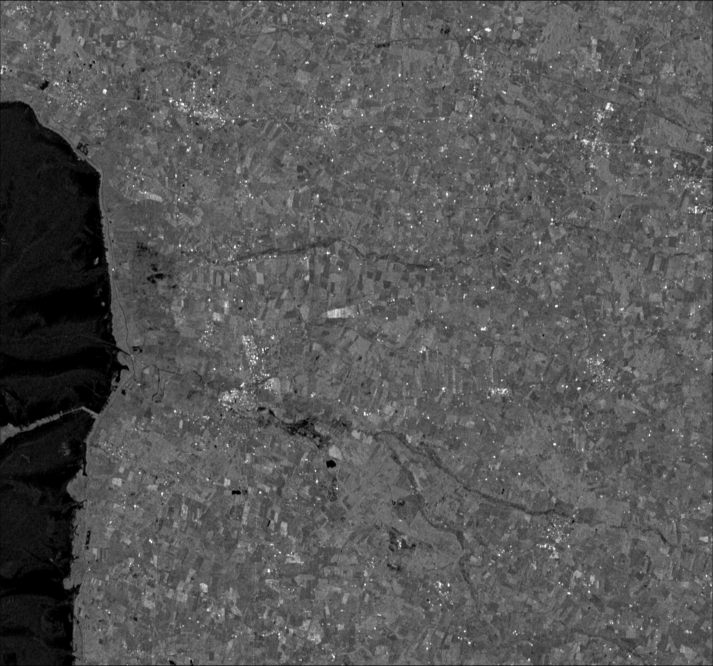

In [130]:
imgVV =  pretty_img([VV,VV],min_vv,max_vv,1)

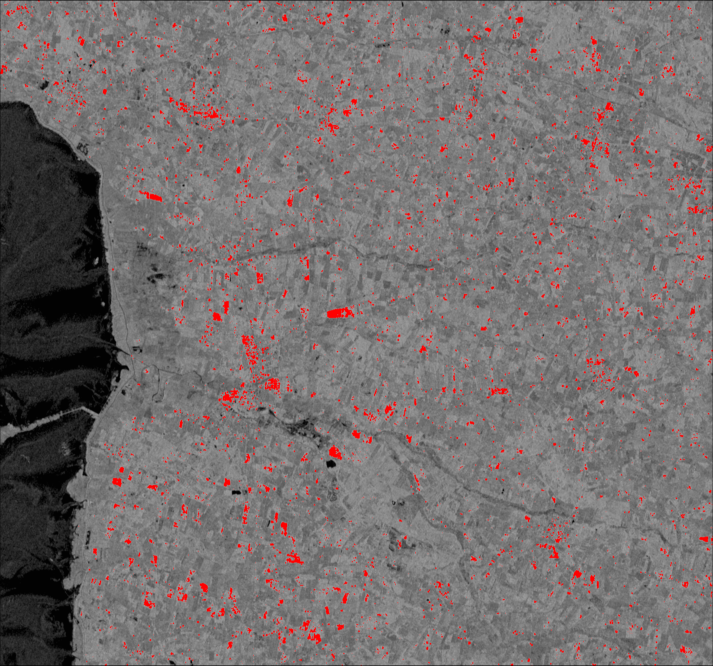

In [134]:
min_mu2 = -7
add_mask(imgVV,pre_VV .>min_mu2,(1,0,0))

In [135]:
# Find the tiles to fit bimodal
bm_mask_VV = find_double_tiles(pre_VV,min_mu2);


Sucess
p_fit: [0.1693566881990714, 0.026449012100461484, -10.402689724825075, -5.157351104985508, 1.9287618655850955, 2.7327038434647473]
cons: [2.2177690772869885, 0.22126924791487435, -5.157351104985508]

Sucess
p_fit: [0.14191894383063827, 0.04788994568721931, -10.783972524311707, -6.92884531166832, 1.1102626040497487, 0.912793844532546]
cons: [3.7931640233104273, 0.2774284303201147, -6.92884531166832]

Sucess
p_fit: [0.16545380632406145, 0.10530727524073395, -9.725674349534293, -6.555516769717733, 1.644573216293056, 0.9511855493072152]
cons: [2.3598252537590296, 0.36812358588171096, -6.555516769717733]

Sucess
p_fit: [0.12740959257737333, 0.025295503964113144, -9.808584234487924, -6.605913606534646, 1.228202662573944, 1.786205498126976]
cons: [2.0894116120985715, 0.28873710427956073, -6.605913606534646]

Sucess
p_fit: [0.14118150470950114, 0.013304672225186916, -11.030044596408143, -6.026192272640752, 1.1220248247299571, 3.354701840846978]
cons: [2.0005038052263107, 0.281759024265

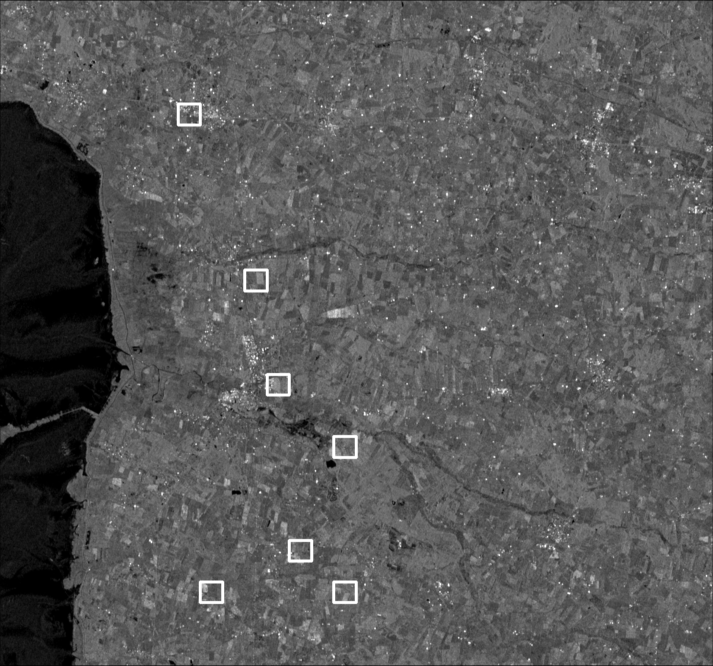

In [136]:
subset_edges = get_edges(bm_mask_VV );
img_save = add_mask(imgVV,subset_edges,(1,1,1))

In [137]:
# fit bimodel
data = reshape(pre_VV,:)[reshape(bm_mask_VV,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

y_seed = find_y_seed2(p_fit,y)

-6.1

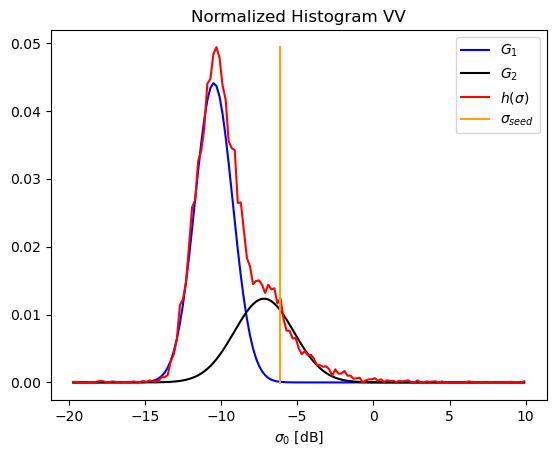

PyObject <matplotlib.legend.Legend object at 0x7f8424c13a00>

In [138]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

### opt one

res = Optim.optimize(
    t -> sse_water_fit_double(pre_VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

## opt 2d

In [139]:
t_0 = [y_seed, y_seed-2]
res = Optim.optimize(
    t -> sse_water_fit_double(pre_VV,bm_mask_VV,
                    p_fit[[2,4,6]],w_sum,edges,y, t),t_0)
thresholds1 = res.minimizer

Max Iter reached:  region_growing()


2-element Array{Float64,1}:
 -8.495435953140257
 -6.533400058746338

In [140]:
thresholds = thresholds1   # [-7,-9] similar to article

2-element Array{Float64,1}:
 -8.495435953140257
 -6.533400058746338

In [141]:

VV_double_mask, steps = region_growing(pre_VV .> thresholds[1],
                                pre_VV .> thresholds[2]);


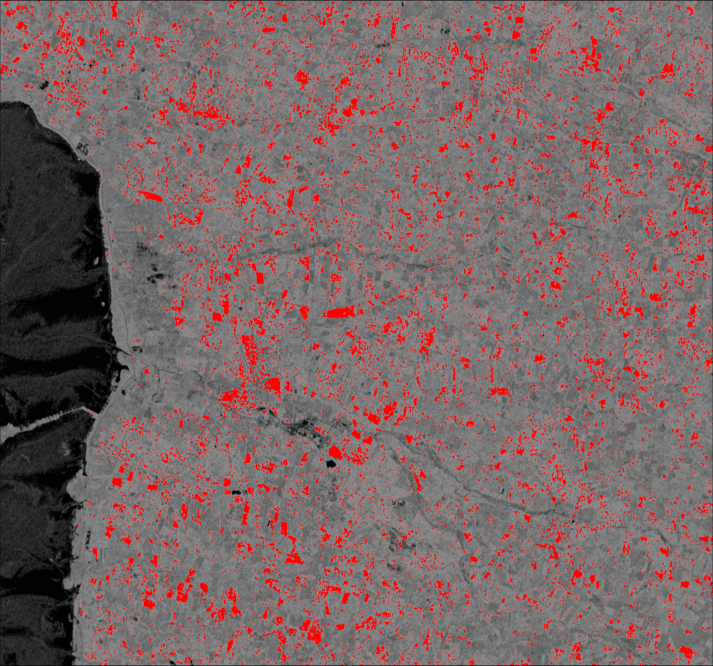

In [142]:
add_mask(test,VV_double_mask,(1,0,0))

In [143]:
# select the water pixelss in the selected tiles
data = reshape(pre_VV,:)[reshape(VV_double_mask.&bm_mask_VV,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

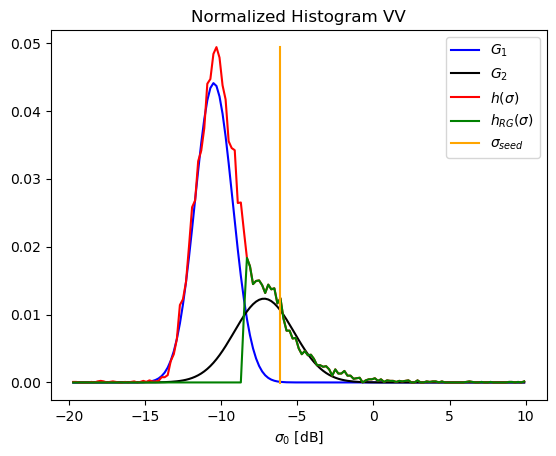

PyObject <matplotlib.legend.Legend object at 0x7f8424b5ec10>

In [144]:

PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])


### VH

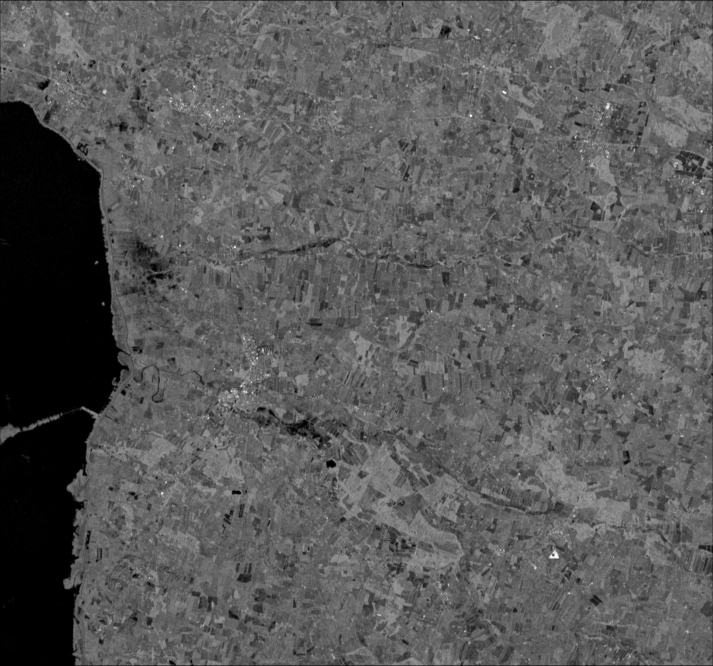

In [173]:
imgVH = Colors.Gray.(db_scale_img(VH,min_vh,max_vh))

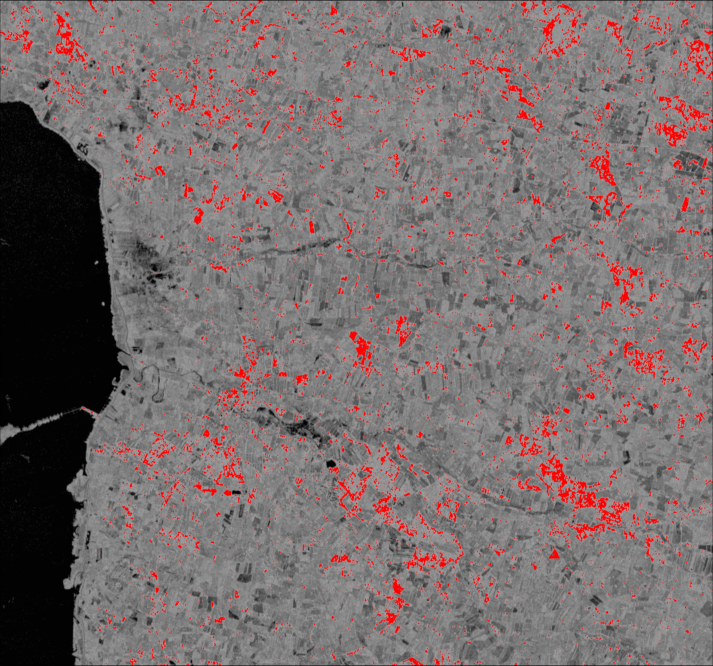

In [183]:
min_mu2 = -14

test = pretty_img([VH,VH],min_vh,max_vh)
add_mask(test,pre_VH .>min_mu2,(1,0,0))

In [184]:
# Find the tiles to fit bimodal
bm_mask_VH = find_double_tiles(pre_VH,min_mu2);


Sucess
p_fit: [0.025753512075919863, 0.008201811168485503, -16.978307434023005, -13.979829969819118, 1.1988198343417396, 1.1521146557835305]
cons: [2.5503780960645974, 0.3060659976787703, -13.979829969819118]

Sucess
p_fit: [0.034842887264203294, 0.02000054835686258, -16.887249891918863, -13.896528554094983, 1.7581338969578915, 0.907299540318615]
cons: [2.1378042137945257, 0.296228275810069, -13.896528554094983]

Sucess
p_fit: [0.14213139288556603, 0.06257893200705715, -15.908507947673108, -13.701117074166799, 1.1432020214639385, 0.5390747785408443]
cons: [2.469858715498747, 0.20761759901401536, -13.701117074166799]

Sucess
p_fit: [0.09477604720792479, 0.0729023992804373, -16.747275477300324, -13.788086980371528, 1.402567411553108, 0.8647719161557489]
cons: [2.539806595232559, 0.4742649864062725, -13.788086980371528]

Sucess
p_fit: [0.10987216818102036, 0.05733931576987239, -16.847726250999973, -13.56032778032618, 1.2894412290309842, 0.8582528258166449]
cons: [3.001435382209909, 0.347

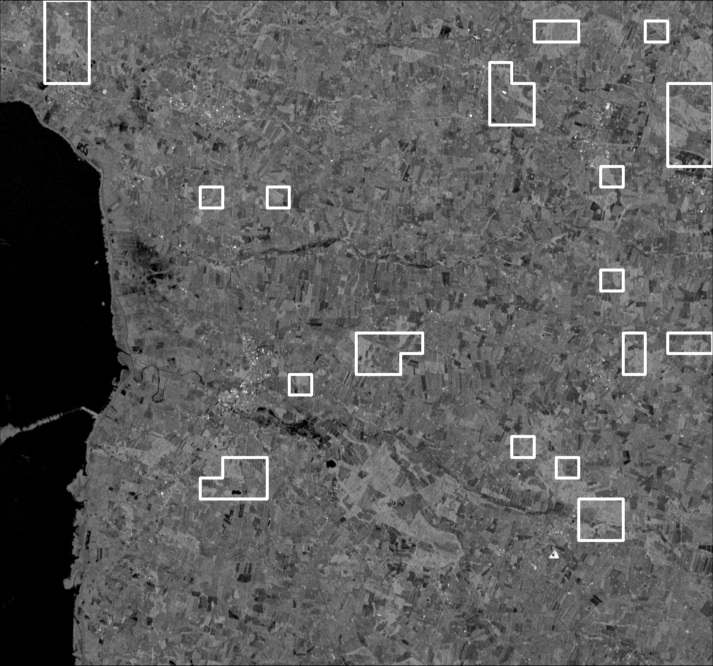

In [185]:
subset_edges = get_edges(bm_mask_VH );
img_save = add_mask(imgVH,subset_edges,(1,1,1))

In [186]:
# fit bimodel
data = reshape(pre_VH,:)[reshape(bm_mask_VH,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

#y_seed = find_y_seed2(p_fit,y)

([0.0038508535948490285, 0.002671764333082025, -16.796528097643776, -13.766456480427564, 1.505354171796843, 0.782781913942408], [-27.049999999999997, -27.03, -27.009999999999998, -26.990000000000002, -26.97, -26.950000000000003, -26.93, -26.91, -26.89, -26.869999999999997  …  3.8099999999999996, 3.83, 3.8499999999999996, 3.87, 3.8899999999999997, 3.91, 3.9299999999999997, 3.95, 3.9699999999999998, 3.99], [1.1009941977605778e-5, 0.0, 1.1009941977605778e-5, 1.1009941977605778e-5, 0.0, 0.0, 0.0, 2.2019883955211556e-5, 0.0, 1.1009941977605778e-5  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1009941977605778e-5], [-27.06, -27.04, -27.02, -27.0, -26.98, -26.96, -26.94, -26.92, -26.9, -26.88  …  3.82, 3.84, 3.86, 3.88, 3.9, 3.92, 3.94, 3.96, 3.98, 4.0], 90827)

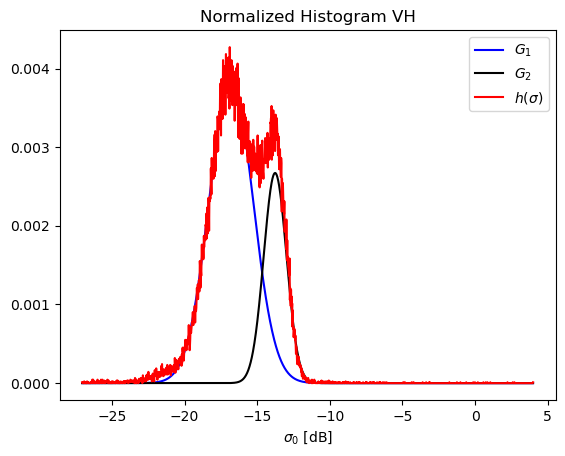

PyObject <matplotlib.legend.Legend object at 0x7f8424a03f70>

In [187]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
#PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

### opt one

res = Optim.optimize(
    t -> sse_water_fit_double(pre_VH,bm_mask_VH,
                    p_fit[[2,4,6]],w_sum,edges,y, [y_seed,t]),
    p_fit[3], y_seed)

y_RG = res.minimizer

## opt 2d

In [188]:
t_0 = [y_seed, y_seed-2]
res = Optim.optimize(
    t -> sse_water_fit_double(pre_VH,bm_mask_VH,
                    p_fit[[2,4,6]],w_sum,edges,y, t),t_0)
thresholds1 = res.minimizer

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_gr

2-element Array{Float64,1}:
  -6.34952926635742
 -16.17720756530762

In [189]:
thresholds = thresholds1  

2-element Array{Float64,1}:
  -6.34952926635742
 -16.17720756530762

In [190]:

VH_double_mask, steps = region_growing(pre_VH .> thresholds[1],
                                pre_VH .> thresholds[2]);


Max Iter reached:  region_growing()


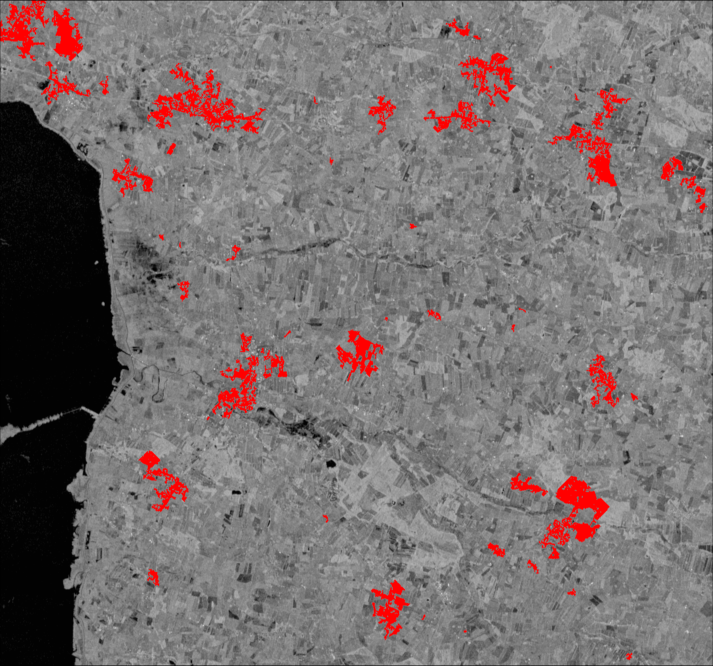

In [191]:
add_mask(test,VH_double_mask,(1,0,0))

In [192]:
# select the water pixelss in the selected tiles
data = reshape(pre_VH,:)[reshape(VH_double_mask.&bm_mask_VH,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

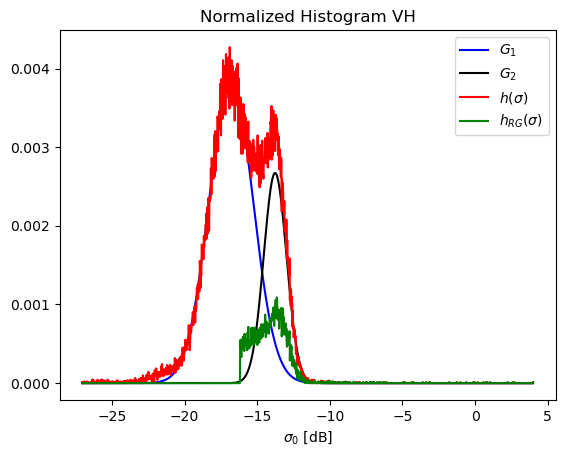

PyObject <matplotlib.legend.Legend object at 0x7f8424934250>

In [193]:

PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
#PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])
